In [1]:
import pandas as pd
import pandas.core.frame
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


/var/folders/k8/8d1w64x142jb_cw3gswr6ybm0000gr/T/ipykernel_55337/1096728750.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [ ]:
#!/usr/bin/env python
# coding: utf-8

class style:
    RESET = "\033[0m"
    BOLD = "\033[1m"
    DIM = "\033[2m"
    UDLINE = "\033[4m"
    BLINK = "\033[5m"
    INVERT = "\033[7m"
    HIDDEN = "\033[8m"


class bg(style):
    RED = "\033[41m"
    YELLOW = "\033[43m"
    LRED = "\033[101m"
    LYELLOW = "\033[103m"


class fg(style):
    BLACK = "\033[30m"
    RED = "\033[31m"
    GREEN = "\033[32m"
    YELLOW = "\033[33m"
    BLUE = "\033[34m"
    LRED = "\033[91m"
    LGREEN = "\033[92m"
    LYELLOW = "\033[93m"
    LBLUE = "\033[94m"
    LMAGENTA = "\033[95m"
    LCYAN = "\033[96m"
    WHITE = "\033[97m"

def data_make_number(
    df: pandas.core.frame.DataFrame, columns: list[str], value_index: list[list[any]]
):
    """
    ### param
    df: pandas.core.frame.DataFrame
    columns: list[str]
    value_index: list[list[any]]
    ### return
    new_df: pandas.core.frame.DataFrame
    ### brief
    데이터를 number 변경하는 함수
    """
    print(fg.LMAGENTA, "🚀 make values number" + fg.RESET, sep="")
    if len(columns) != len(value_index):
        print(
            fg.LRED + "arg is diff len\n" + fg.RESET,
            "columns" + fg.GREEN + "[" + str(len(columns)) + "]" + fg.RESET,
            " != ",
            "value_index" + fg.GREEN + "[" + str(len(value_index)) + "]" + fg.RESET,
            sep="",
        )
    new_df = df.copy(deep=True)
    for column_idx, column in enumerate(columns):
        for value_idx, value in enumerate(value_index[column_idx]):
            new_df[column] = new_df[column].replace(value, value_idx)
        try:
            new_df[column] = new_df[column].astype(float)
        except:
            print(fg.LRED + "some value is not catched" + fg.RESET)
            return df
    print(fg.LGREEN, "OK", sep="")
    return new_df


In [2]:
df_ori_train = pd.read_csv("data/train.csv")
df_train = df_ori_train
print(df_train.shape)
df_train.head(5)

df_ori_test = pd.read_csv("data/test.csv")
df_test = df_ori_test
print(df_test.shape)
df_test.head(5)


(96294, 15)
(64197, 14)


,ID,대출금액,대출기간,근로기간,주택소유상태,연간소득,부채_대비_소득_비율,총계좌수,대출목적,최근_2년간_연체_횟수,총상환원금,총상환이자,총연체금액,연체계좌수
0,TEST_00000,16800000,36 months,8 years,MORTGAGE,132000000,19.64,12,주택 개선,0,394692,146604.0,0.0,0.0
1,TEST_00001,8400000,36 months,5 years,RENT,89971200,15.84,25,부채 통합,0,0,0.0,0.0,0.0
2,TEST_00002,17280000,36 months,6 years,RENT,150000000,8.41,20,신용 카드,0,1786980,281820.0,0.0,0.0
3,TEST_00003,14400000,36 months,5 years,MORTGAGE,66000000,13.72,30,신용 카드,1,669024,281724.0,0.0,0.0
4,TEST_00004,27600000,36 months,5 years,RENT,55200000,30.50,12,신용 카드,0,1250052,614844.0,0.0,0.0


In [3]:
show_unique(df_test)

🚀 unique values
ID [64197]{object} : ['TEST_00000', 'TEST_00001', 'TEST_00002', 'TEST_00003', 'TEST_00004', 'TEST_00005', 'TEST_00006', 'TEST_00007', 'TEST_00008', 'TEST_00009', 'TEST_00010', 'TEST_00011', 'TEST_00012', 'TEST_00013', 'TEST_00014', 'TEST_00015', 'TEST_00016', 'TEST_00017', 'TEST_00018', 'TEST_00019', 'TEST_00020', 'TEST_00021', 'TEST_00022', 'TEST_00023', 'TEST_00024', 'TEST_00025', 'TEST_00026', 'TEST_00027', 'TEST_00028', 'TEST_00029', 'TEST_00030', 'TEST_00031', 'TEST_00032', 'TEST_00033', 'TEST_00034', 'TEST_00035', 'TEST_00036', 'TEST_00037', 'TEST_00038', 'TEST_00039', 'TEST_00040', 'TEST_00041', 'TEST_00042', 'TEST_00043', 'TEST_00044', 'TEST_00045', 'TEST_00046', 'TEST_00047', 'TEST_00048', 'TEST_00049', 'TEST_00050', 'TEST_00051', 'TEST_00052', 'TEST_00053', 'TEST_00054', 'TEST_00055', 'TEST_00056', 'TEST_00057', 'TEST_00058', 'TEST_00059', 'TEST_00060', 'TEST_00061', 'TEST_00062', 'TEST_00063', 'TEST_00064', 'TEST_00065', 'TEST_00066', 'TEST_00067', 'TEST_0006

In [4]:
df_replace = df_test.copy()
['기타', '부채 통합', '소규모 사업', '신용 카드', '의료', '이사', '자동차', '재생 에너지', '주요 구매', '주택', '주택 개선', '휴가']
df_replace['대출목적_기타'] = (df_replace['대출목적'] == '기타').astype(int)
df_replace['대출목적_부채'] = (df_replace['대출목적'] == '부채 통합').astype(int)
df_replace['대출목적_사업'] = (df_replace['대출목적'] == '소규모 사업').astype(int)
df_replace['대출목적_신용'] = (df_replace['대출목적'] == '신용 카드').astype(int)
df_replace['대출목적_의료'] = (df_replace['대출목적'] == '의료').astype(int)
df_replace['대출목적_이사'] = (df_replace['대출목적'] == '이사').astype(int)
df_replace['대출목적_자동차'] = (df_replace['대출목적'] == '자동차').astype(int)
df_replace['대출목적_에너지'] = (df_replace['대출목적'] == '재생 에너지').astype(int)
df_replace['대출목적_구매'] = (df_replace['대출목적'] == '주요 구매').astype(int)
df_replace['대출목적_주택'] = (df_replace['대출목적'] == '주택').astype(int)
df_replace['대출목적_주택_개선'] = (df_replace['대출목적'] == '주택 개선').astype(int)
df_replace['대출목적_휴가'] = (df_replace['대출목적'] == '휴가').astype(int)


df_replace['근로기간'] = df_replace['근로기간'].replace('Unknown', '0')
df_replace['근로기간'] = df_replace['근로기간'].replace('< 1 year', '0.5')
df_replace['근로기간'] = df_replace['근로기간'].replace('<1 year', '0.5')
df_replace['근로기간'] = df_replace['근로기간'].replace('1 year', '1')
df_replace['근로기간'] = df_replace['근로기간'].replace('1 years', '1')
df_replace['근로기간'] = df_replace['근로기간'].replace('2 years', '2')
df_replace['근로기간'] = df_replace['근로기간'].replace('3 years', '3')
df_replace['근로기간'] = df_replace['근로기간'].replace('4 years', '4')
df_replace['근로기간'] = df_replace['근로기간'].replace('5 years', '5')
df_replace['근로기간'] = df_replace['근로기간'].replace('6 years', '6')
df_replace['근로기간'] = df_replace['근로기간'].replace('7 years', '7')
df_replace['근로기간'] = df_replace['근로기간'].replace('8 years', '8')
df_replace['근로기간'] = df_replace['근로기간'].replace('9 years', '9')
df_replace['근로기간'] = df_replace['근로기간'].replace('10+ years', '10')
df_replace['근로기간'] = df_replace['근로기간'].replace('10+years', '10')



In [5]:
show_unique(df_replace)

🚀 unique values
ID [64197]{object} : ['TEST_00000', 'TEST_00001', 'TEST_00002', 'TEST_00003', 'TEST_00004', 'TEST_00005', 'TEST_00006', 'TEST_00007', 'TEST_00008', 'TEST_00009', 'TEST_00010', 'TEST_00011', 'TEST_00012', 'TEST_00013', 'TEST_00014', 'TEST_00015', 'TEST_00016', 'TEST_00017', 'TEST_00018', 'TEST_00019', 'TEST_00020', 'TEST_00021', 'TEST_00022', 'TEST_00023', 'TEST_00024', 'TEST_00025', 'TEST_00026', 'TEST_00027', 'TEST_00028', 'TEST_00029', 'TEST_00030', 'TEST_00031', 'TEST_00032', 'TEST_00033', 'TEST_00034', 'TEST_00035', 'TEST_00036', 'TEST_00037', 'TEST_00038', 'TEST_00039', 'TEST_00040', 'TEST_00041', 'TEST_00042', 'TEST_00043', 'TEST_00044', 'TEST_00045', 'TEST_00046', 'TEST_00047', 'TEST_00048', 'TEST_00049', 'TEST_00050', 'TEST_00051', 'TEST_00052', 'TEST_00053', 'TEST_00054', 'TEST_00055', 'TEST_00056', 'TEST_00057', 'TEST_00058', 'TEST_00059', 'TEST_00060', 'TEST_00061', 'TEST_00062', 'TEST_00063', 'TEST_00064', 'TEST_00065', 'TEST_00066', 'TEST_00067', 'TEST_0006

In [6]:
df_learn = data_make_number(
    df_replace,
    [
        "대출기간",
        "근로기간",
        "주택소유상태"
    ],
    [
        [" 36 months", " 60 months"],
        ['0', '0.5', '1', '10', '2', '3', '4', '5', '6', '7', '8', '9'],
        ['ANY', 'RENT', 'MORTGAGE', 'OWN']
    ],
)

🚀 make values number
OK


/Users/test/goinfree/Coaching_Study_Data_Science_Projects_2024/kyoulee/week_4/tools/data_make_tools.py:61: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  new_df[column] = new_df[column].replace(value, value_idx)
/Users/test/goinfree/Coaching_Study_Data_Science_Projects_2024/kyoulee/week_4/tools/data_make_tools.py:61: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  new_df[column] = new_df[column].replace(value, value_idx)
/Users/test/goinfree/Coaching_Study_Data_Science_Projects_2024/kyoulee/week_4/tools/data_make_tools.py:61: FutureW

In [7]:
real_test = df_learn
show_unique(df_learn)

🚀 unique values
ID [64197]{object} : ['TEST_00000', 'TEST_00001', 'TEST_00002', 'TEST_00003', 'TEST_00004', 'TEST_00005', 'TEST_00006', 'TEST_00007', 'TEST_00008', 'TEST_00009', 'TEST_00010', 'TEST_00011', 'TEST_00012', 'TEST_00013', 'TEST_00014', 'TEST_00015', 'TEST_00016', 'TEST_00017', 'TEST_00018', 'TEST_00019', 'TEST_00020', 'TEST_00021', 'TEST_00022', 'TEST_00023', 'TEST_00024', 'TEST_00025', 'TEST_00026', 'TEST_00027', 'TEST_00028', 'TEST_00029', 'TEST_00030', 'TEST_00031', 'TEST_00032', 'TEST_00033', 'TEST_00034', 'TEST_00035', 'TEST_00036', 'TEST_00037', 'TEST_00038', 'TEST_00039', 'TEST_00040', 'TEST_00041', 'TEST_00042', 'TEST_00043', 'TEST_00044', 'TEST_00045', 'TEST_00046', 'TEST_00047', 'TEST_00048', 'TEST_00049', 'TEST_00050', 'TEST_00051', 'TEST_00052', 'TEST_00053', 'TEST_00054', 'TEST_00055', 'TEST_00056', 'TEST_00057', 'TEST_00058', 'TEST_00059', 'TEST_00060', 'TEST_00061', 'TEST_00062', 'TEST_00063', 'TEST_00064', 'TEST_00065', 'TEST_00066', 'TEST_00067', 'TEST_0006

대출금액 [1309]{int64} : [1200000, 1230000, 1260000, 1320000, 1350000, 1380000, 1410000, 1440000, 1530000, 1560000, 1590000, 1620000, 1650000, 1680000, 1740000, 1770000, 1800000, 1830000, 1860000, 1890000, 1920000, 2010000, 2040000, 2100000, 2130000, 2160000, 2190000, 2220000, 2250000, 2280000, 2310000, 2340000, 2370000, 2400000, 2430000, 2460000, 2490000, 2520000, 2550000, 2580000, 2610000, 2640000, 2670000, 2700000, 2730000, 2760000, 2790000, 2820000, 2850000, 2880000, 2910000, 2940000, 2970000, 3000000, 3030000, 3060000, 3090000, 3120000, 3150000, 3180000, 3210000, 3240000, 3270000, 3300000, 3330000, 3360000, 3390000, 3420000, 3450000, 3480000, 3510000, 3540000, 3570000, 3600000, 3630000, 3660000, 3690000, 3720000, 3750000, 3780000, 3810000, 3840000, 3870000, 3900000, 3930000, 3960000, 3990000, 4020000, 4050000, 4080000, 4110000, 4140000, 4170000, 4200000, 4230000, 4260000, 4290000, 4320000, 4350000, 4380000, 4410000, 4440000, 4470000, 4500000, 4530000, 4560000, 4590000, 4620000, 465000

In [8]:
show_unique(df_train)

🚀 unique values
ID [96294]{object} : ['TRAIN_00000', 'TRAIN_00001', 'TRAIN_00002', 'TRAIN_00003', 'TRAIN_00004', 'TRAIN_00005', 'TRAIN_00006', 'TRAIN_00007', 'TRAIN_00008', 'TRAIN_00009', 'TRAIN_00010', 'TRAIN_00011', 'TRAIN_00012', 'TRAIN_00013', 'TRAIN_00014', 'TRAIN_00015', 'TRAIN_00016', 'TRAIN_00017', 'TRAIN_00018', 'TRAIN_00019', 'TRAIN_00020', 'TRAIN_00021', 'TRAIN_00022', 'TRAIN_00023', 'TRAIN_00024', 'TRAIN_00025', 'TRAIN_00026', 'TRAIN_00027', 'TRAIN_00028', 'TRAIN_00029', 'TRAIN_00030', 'TRAIN_00031', 'TRAIN_00032', 'TRAIN_00033', 'TRAIN_00034', 'TRAIN_00035', 'TRAIN_00036', 'TRAIN_00037', 'TRAIN_00038', 'TRAIN_00039', 'TRAIN_00040', 'TRAIN_00041', 'TRAIN_00042', 'TRAIN_00043', 'TRAIN_00044', 'TRAIN_00045', 'TRAIN_00046', 'TRAIN_00047', 'TRAIN_00048', 'TRAIN_00049', 'TRAIN_00050', 'TRAIN_00051', 'TRAIN_00052', 'TRAIN_00053', 'TRAIN_00054', 'TRAIN_00055', 'TRAIN_00056', 'TRAIN_00057', 'TRAIN_00058', 'TRAIN_00059', 'TRAIN_00060', 'TRAIN_00061', 'TRAIN_00062', 'TRAIN_00063', 'T

In [9]:
lanks = ['A', 'B', 'C', 'D', 'E', 'F', 'G']
lank_lists = []
for lank in lanks:
    lank_list = []
    for check in ['기타', '부채 통합', '소규모 사업', '신용 카드', '의료', '이사', '자동차', '재생 에너지', '주요 구매', '주택', '주택 개선', '휴가']:
        lank_list.append(sum(df_train[df_train['대출목적'] == check]['대출등급'] == lank))
    lank_lists.append(lank_list)
pd.DataFrame(lank_lists, index=lanks ,columns=['기타', '부채 통합', '소규모 사업', '신용 카드', '의료', '이사', '자동차', '재생 에너지', '주요 구매', '주택', '주택 개선', '휴가'])

,기타,부채 통합,소규모 사업,신용 카드,의료,이사,자동차,재생 에너지,주요 구매,주택,주택 개선,휴가
A,356,8036,19,6424,104,13,174,1,372,8,1225,40
B,1080,15680,75,8917,238,86,258,4,479,36,1845,119
C,1705,16349,249,6036,375,203,213,20,503,85,1689,196
D,916,8529,192,2092,197,131,87,21,238,68,805,78
E,478,4979,158,877,91,50,46,10,150,63,425,27
F,147,1311,64,137,27,18,15,4,53,29,145,4
G,43,266,30,17,7,5,4,0,8,12,26,2


In [10]:
df_replace = df_train.copy()

In [11]:
df_replace = df_train.copy()
['기타', '부채 통합', '소규모 사업', '신용 카드', '의료', '이사', '자동차', '재생 에너지', '주요 구매', '주택', '주택 개선', '휴가']
df_replace['대출목적_기타'] = (df_replace['대출목적'] == '기타').astype(int)
df_replace['대출목적_부채'] = (df_replace['대출목적'] == '부채 통합').astype(int)
df_replace['대출목적_사업'] = (df_replace['대출목적'] == '소규모 사업').astype(int)
df_replace['대출목적_신용'] = (df_replace['대출목적'] == '신용 카드').astype(int)
df_replace['대출목적_의료'] = (df_replace['대출목적'] == '의료').astype(int)
df_replace['대출목적_이사'] = (df_replace['대출목적'] == '이사').astype(int)
df_replace['대출목적_자동차'] = (df_replace['대출목적'] == '자동차').astype(int)
df_replace['대출목적_에너지'] = (df_replace['대출목적'] == '재생 에너지').astype(int)
df_replace['대출목적_구매'] = (df_replace['대출목적'] == '주요 구매').astype(int)
df_replace['대출목적_주택'] = (df_replace['대출목적'] == '주택').astype(int)
df_replace['대출목적_주택_개선'] = (df_replace['대출목적'] == '주택 개선').astype(int)
df_replace['대출목적_휴가'] = (df_replace['대출목적'] == '휴가').astype(int)


df_replace['근로기간'] = df_replace['근로기간'].replace('Unknown', '0')
df_replace['근로기간'] = df_replace['근로기간'].replace('< 1 year', '0.5')
df_replace['근로기간'] = df_replace['근로기간'].replace('<1 year', '0.5')
df_replace['근로기간'] = df_replace['근로기간'].replace('1 year', '1')
df_replace['근로기간'] = df_replace['근로기간'].replace('1 years', '1')
df_replace['근로기간'] = df_replace['근로기간'].replace('2 years', '2')
df_replace['근로기간'] = df_replace['근로기간'].replace('3 years', '3')
df_replace['근로기간'] = df_replace['근로기간'].replace('4 years', '4')
df_replace['근로기간'] = df_replace['근로기간'].replace('5 years', '5')
df_replace['근로기간'] = df_replace['근로기간'].replace('6 years', '6')
df_replace['근로기간'] = df_replace['근로기간'].replace('7 years', '7')
df_replace['근로기간'] = df_replace['근로기간'].replace('8 years', '8')
df_replace['근로기간'] = df_replace['근로기간'].replace('9 years', '9')
df_replace['근로기간'] = df_replace['근로기간'].replace('10+ years', '10')
df_replace['근로기간'] = df_replace['근로기간'].replace('10+years', '10')



In [12]:
show_unique(df_replace)

🚀 unique values
ID [96294]{object} : ['TRAIN_00000', 'TRAIN_00001', 'TRAIN_00002', 'TRAIN_00003', 'TRAIN_00004', 'TRAIN_00005', 'TRAIN_00006', 'TRAIN_00007', 'TRAIN_00008', 'TRAIN_00009', 'TRAIN_00010', 'TRAIN_00011', 'TRAIN_00012', 'TRAIN_00013', 'TRAIN_00014', 'TRAIN_00015', 'TRAIN_00016', 'TRAIN_00017', 'TRAIN_00018', 'TRAIN_00019', 'TRAIN_00020', 'TRAIN_00021', 'TRAIN_00022', 'TRAIN_00023', 'TRAIN_00024', 'TRAIN_00025', 'TRAIN_00026', 'TRAIN_00027', 'TRAIN_00028', 'TRAIN_00029', 'TRAIN_00030', 'TRAIN_00031', 'TRAIN_00032', 'TRAIN_00033', 'TRAIN_00034', 'TRAIN_00035', 'TRAIN_00036', 'TRAIN_00037', 'TRAIN_00038', 'TRAIN_00039', 'TRAIN_00040', 'TRAIN_00041', 'TRAIN_00042', 'TRAIN_00043', 'TRAIN_00044', 'TRAIN_00045', 'TRAIN_00046', 'TRAIN_00047', 'TRAIN_00048', 'TRAIN_00049', 'TRAIN_00050', 'TRAIN_00051', 'TRAIN_00052', 'TRAIN_00053', 'TRAIN_00054', 'TRAIN_00055', 'TRAIN_00056', 'TRAIN_00057', 'TRAIN_00058', 'TRAIN_00059', 'TRAIN_00060', 'TRAIN_00061', 'TRAIN_00062', 'TRAIN_00063', 'T

In [13]:
df_learn = data_make_number(
    df_replace,
    [
        "대출기간",
        "근로기간",
        "주택소유상태",
        "대출등급"
    ],
    [
        [" 36 months", " 60 months"],
        ['0', '0.5', '1', '10', '2', '3', '4', '5', '6', '7', '8', '9'],
        ['ANY', 'RENT', 'MORTGAGE', 'OWN'],
        ['A', 'B', 'C', 'D', 'E', 'F', 'G']
    ],
)

🚀 make values number
OK


/Users/test/goinfree/Coaching_Study_Data_Science_Projects_2024/kyoulee/week_4/tools/data_make_tools.py:61: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  new_df[column] = new_df[column].replace(value, value_idx)
/Users/test/goinfree/Coaching_Study_Data_Science_Projects_2024/kyoulee/week_4/tools/data_make_tools.py:61: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  new_df[column] = new_df[column].replace(value, value_idx)
/Users/test/goinfree/Coaching_Study_Data_Science_Projects_2024/kyoulee/week_4/tools/data_make_tools.py:61: FutureW

In [14]:
show_unique(df_learn)

🚀 unique values
ID [96294]{object} : ['TRAIN_00000', 'TRAIN_00001', 'TRAIN_00002', 'TRAIN_00003', 'TRAIN_00004', 'TRAIN_00005', 'TRAIN_00006', 'TRAIN_00007', 'TRAIN_00008', 'TRAIN_00009', 'TRAIN_00010', 'TRAIN_00011', 'TRAIN_00012', 'TRAIN_00013', 'TRAIN_00014', 'TRAIN_00015', 'TRAIN_00016', 'TRAIN_00017', 'TRAIN_00018', 'TRAIN_00019', 'TRAIN_00020', 'TRAIN_00021', 'TRAIN_00022', 'TRAIN_00023', 'TRAIN_00024', 'TRAIN_00025', 'TRAIN_00026', 'TRAIN_00027', 'TRAIN_00028', 'TRAIN_00029', 'TRAIN_00030', 'TRAIN_00031', 'TRAIN_00032', 'TRAIN_00033', 'TRAIN_00034', 'TRAIN_00035', 'TRAIN_00036', 'TRAIN_00037', 'TRAIN_00038', 'TRAIN_00039', 'TRAIN_00040', 'TRAIN_00041', 'TRAIN_00042', 'TRAIN_00043', 'TRAIN_00044', 'TRAIN_00045', 'TRAIN_00046', 'TRAIN_00047', 'TRAIN_00048', 'TRAIN_00049', 'TRAIN_00050', 'TRAIN_00051', 'TRAIN_00052', 'TRAIN_00053', 'TRAIN_00054', 'TRAIN_00055', 'TRAIN_00056', 'TRAIN_00057', 'TRAIN_00058', 'TRAIN_00059', 'TRAIN_00060', 'TRAIN_00061', 'TRAIN_00062', 'TRAIN_00063', 'T

In [15]:
columns_num = ['대출금액', '대출기간', '근로기간', '주택소유상태', '연간소득', '부채_대비_소득_비율', '총계좌수',
       '최근_2년간_연체_횟수', '총상환원금', '총상환이자', '총연체금액', '연체계좌수',
       '대출목적_기타', '대출목적_부채', '대출목적_사업', '대출목적_신용', '대출목적_의료', '대출목적_이사',
       '대출목적_자동차', '대출목적_에너지', '대출목적_구매', '대출목적_주택', '대출목적_주택_개선', '대출목적_휴가', '대출등급']
df_clear = df_learn[columns_num]

/Users/test/Library/Python/3.9/lib/python/site-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()


<Axes: >

/Users/test/Library/Python/3.9/lib/python/site-packages/IPython/core/events.py:82: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
/Users/test/Library/Python/3.9/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


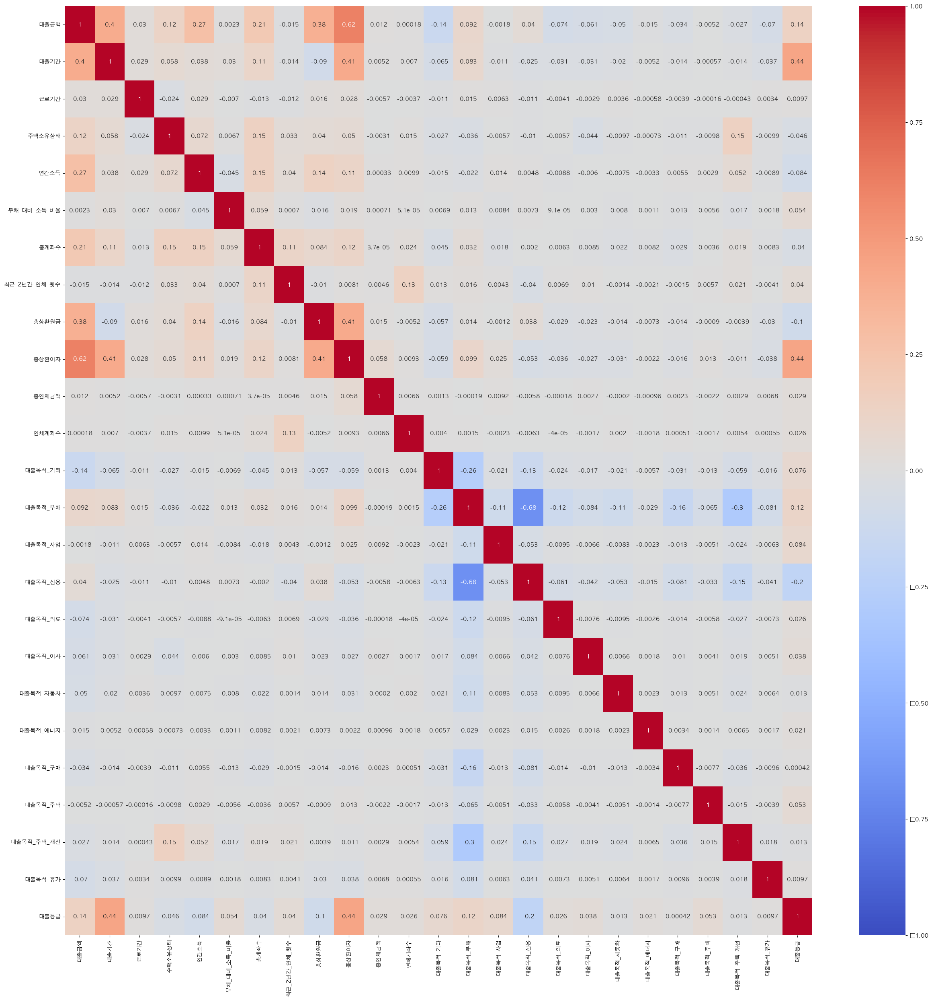

In [16]:

df_corr = df_clear.corr()
df_corr.style.background_gradient()
plt.rcParams['font.family'] = 'AppleGothic'
plt.figure(figsize=(30, 30))
sns.heatmap(df_corr, annot=True, vmax=1, vmin=-1, cmap="coolwarm")


/var/folders/k8/8d1w64x142jb_cw3gswr6ybm0000gr/T/ipykernel_54898/2532583105.py:17: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], ax=axes[row][col])
/var/folders/k8/8d1w64x142jb_cw3gswr6ybm0000gr/T/ipykernel_54898/2532583105.py:18: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[colu

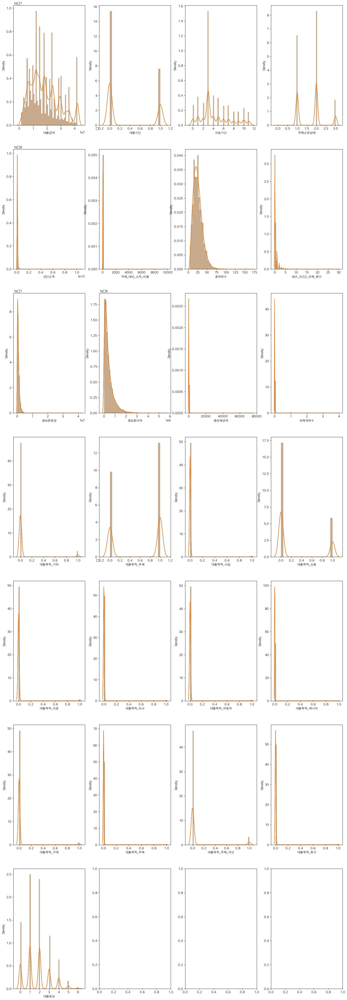

In [12]:

def show_distplot(df: pandas.core.frame.DataFrame, cols: list[str], size: int = 3, x_size: int = 20, y_size: int = 20):
    if size < 1:
        return
    
    row_size = len(cols) // size + int(len(cols) / size > len(cols) // size)
    fig, axes = plt.subplots(nrows=row_size, ncols=size, figsize=(x_size, y_size))

    if row_size == 1:
        for i, column in enumerate(cols):
            col = i % size
            sns.distplot(df[column], ax=axes[col])
            sns.distplot(df[column], ax=axes[col])
    else:
        for i, column in enumerate(cols):
            row = i // size
            col = i % size
            sns.distplot(df[column], ax=axes[row][col])
            sns.distplot(df[column], ax=axes[row][col])

show_distplot(df_clear, columns_num, 4,20,60)

/Users/test/Library/Python/3.9/lib/python/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/test/Library/Python/3.9/lib/python/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/test/Library/Python/3.9/lib/python/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/test/Library/Python/3.9/lib

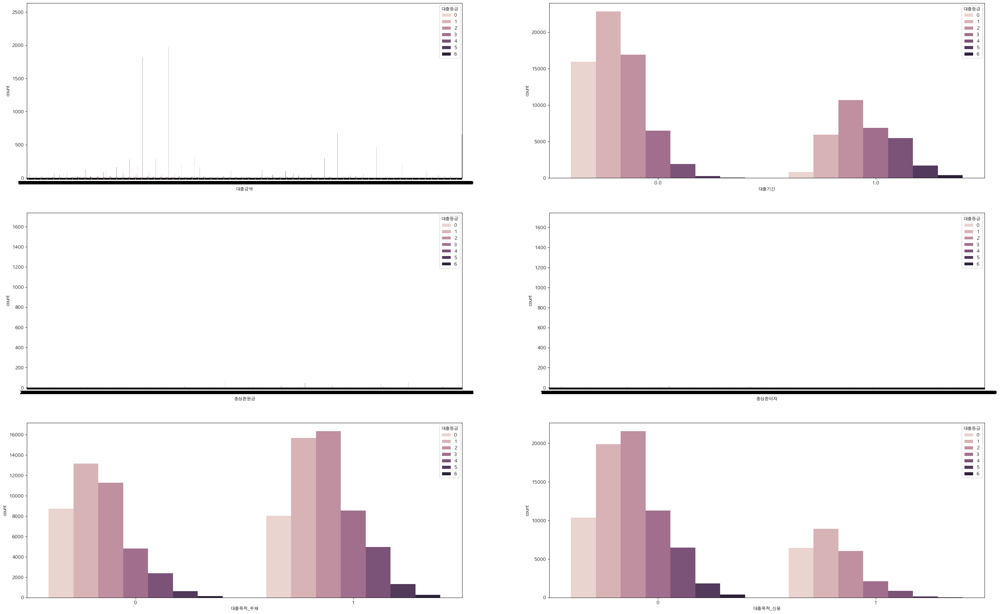

In [14]:
def show_countplot(
    df: pandas.core.frame.DataFrame,
    cols: list[str],
    size: int = 3,
    hue: str = "",
    x_size: int = 20,
    y_size: int = 20,
):
    if size < 1:
        return
    row_size = len(cols) // size + int(len(cols) / size > len(cols) // size)
    fig, axes = plt.subplots(nrows=row_size, ncols=size, figsize=(x_size, y_size))

    if row_size == 1:
        for i, column in enumerate(cols):
            col = i % size
            sns.countplot(df, x=column, hue=hue, ax=axes[col])
    else:
        for i, column in enumerate(cols):
            row = i // size
            col = i % size
            sns.countplot(df, x=column, hue=hue, ax=axes[row][col])

show_countplot(df_clear, ['대출금액', '대출기간', '총상환원금', '총상환이자', '대출목적_부채', '대출목적_신용'], 2, "대출등급", 40, 25)


In [15]:
df_pair = sns.pairplot(df_clear, hue="대출등급")
df_pair.map(plt.scatter)

/Users/test/Library/Python/3.9/lib/python/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/test/Library/Python/3.9/lib/python/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/test/Library/Python/3.9/lib/python/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/test/Library/Python/3.9/lib

In [17]:
# 8:2 의 비율로 구하기 위해 전체 데이터의 행에서 80% 위치에 해당되는 값을 구해서 split_count 라는 변수에 담습니다.
from sklearn.model_selection import train_test_split

X ,y= df_clear[columns_num[:-1]], df_clear['대출등급']

X_train, X_test, y_train, y_test= train_test_split(X, y ,test_size=0.3)

feature_names = X_train.columns.to_list()
label_name = '대출등급'

X_train.head(5)

,대출금액,대출기간,근로기간,주택소유상태,연간소득,부채_대비_소득_비율,총계좌수,최근_2년간_연체_횟수,총상환원금,총상환이자,...,대출목적_사업,대출목적_신용,대출목적_의료,대출목적_이사,대출목적_자동차,대출목적_에너지,대출목적_구매,대출목적_주택,대출목적_주택_개선,대출목적_휴가
66993,23250000,1.0,9.0,2.0,86400000,26.90,49,0,488808,665400.0,...,0,1,0,0,0,0,0,0,0,0
87651,5400000,0.0,8.0,2.0,137232000,20.75,62,0,270252,62340.0,...,0,0,0,0,0,0,1,0,0,0
74341,14820000,1.0,9.0,1.0,118949748,15.74,17,1,513012,524508.0,...,0,0,0,0,0,0,0,0,0,0
8424,13200000,0.0,10.0,2.0,69360000,12.15,9,0,339000,54624.0,...,0,1,0,0,0,0,0,0,0,0
821,12000000,0.0,7.0,2.0,122400000,36.47,50,0,895452,225588.0,...,0,0,0,0,0,0,0,0,0,0


In [18]:

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

train_count = 5
train_deep = 20
deep_best_model = [[None, 0]] * train_deep
deepcheck = [0] * train_deep
for check in range(0,5):
    good_model = None
    best_score = 0
    for max_depth in range(1, train_deep):
        model = DecisionTreeClassifier(max_depth=max_depth)
        score = [0] * train_count
        good_score = 0
        for index in range(0, train_count):
            y_predict = model.fit(X_train, y_train).predict(X_test)
            score[index] = accuracy_score(y_test, y_predict)
            if max(score) == score[index]:
                good_model, good_score = model, score[index]
        if best_score < sum(score) / train_count:
            best_score = sum(score) / train_count
            if (deep_best_model[max_depth][1] < good_score):
                print("New best_model deep[", max_depth, "]: ", deep_best_model[max_depth][1], " -> ", good_score, sep="")
                deep_best_model[max_depth] = [good_model, good_score]
            deepcheck[max_depth] += 1
        print(max_depth, " : ", sum(score) / train_count)  
print(deepcheck)
select_model = None
for index, value in enumerate(deepcheck):
    if (deepcheck[index] > (train_count * 0.625)):
        select_model = deep_best_model[index][0]
        print("changed model index : ", index, sep="")
select_model



New best_model deep[1]: 0 -> 0.34642943680985844
1  :  0.34642943680985844
New best_model deep[2]: 0 -> 0.3529024888365814
2  :  0.3529024888365814
New best_model deep[3]: 0 -> 0.38461005919208
3  :  0.38461005919208
New best_model deep[4]: 0 -> 0.43750216345321746
4  :  0.43750216345321746
New best_model deep[5]: 0 -> 0.47900584997750006
5  :  0.4790058499775
New best_model deep[6]: 0 -> 0.5609401502301914
6  :  0.5609401502301914
New best_model deep[7]: 0 -> 0.6051092111184188
7  :  0.6051092111184188
New best_model deep[8]: 0 -> 0.675170480113538
8  :  0.6751427879123544
New best_model deep[9]: 0 -> 0.7109972653951331
9  :  0.7108795735401017
New best_model deep[10]: 0 -> 0.7722662605143826
10  :  0.7721762608605351
New best_model deep[11]: 0 -> 0.7956661705147288
11  :  0.7952023261448994
New best_model deep[12]: 0 -> 0.8138737927931047
12  :  0.8135691785800823
New best_model deep[13]: 0 -> 0.8222506836512167
13  :  0.8217383779293158
New best_model deep[14]: 0 -> 0.83270448959811

DecisionTreeClassifier(max_depth=17)

In [22]:
y_predict = select_model.predict(X_test)

accuracy_score(y_test, y_predict) * 100

83.54737097165011

In [19]:
result = select_model.predict(real_test[columns_num[:-1]])
result


array([1., 1., 0., ..., 3., 2., 0.])

In [44]:
result_alpha = [np.NaN] * result.shape[0]
for index, value in enumerate(['A', 'B', 'C', 'D', 'E', 'F', 'G']):
        result_alpha = np.where(result == index, value,result_alpha)
result_alpha


array(['B', 'B', 'A', ..., 'D', 'C', 'A'], dtype='<U32')

In [48]:
real_test

,ID,대출금액,대출기간,근로기간,주택소유상태,연간소득,부채_대비_소득_비율,총계좌수,대출목적,최근_2년간_연체_횟수,...,대출목적_사업,대출목적_신용,대출목적_의료,대출목적_이사,대출목적_자동차,대출목적_에너지,대출목적_구매,대출목적_주택,대출목적_주택_개선,대출목적_휴가
0,TEST_00000,16800000,0.0,10.0,2.0,132000000,19.64,12,주택 개선,0,...,0,0,0,0,0,0,0,0,1,0
1,TEST_00001,8400000,0.0,7.0,1.0,89971200,15.84,25,부채 통합,0,...,0,0,0,0,0,0,0,0,0,0
2,TEST_00002,17280000,0.0,8.0,1.0,150000000,8.41,20,신용 카드,0,...,0,1,0,0,0,0,0,0,0,0
3,TEST_00003,14400000,0.0,7.0,2.0,66000000,13.72,30,신용 카드,1,...,0,1,0,0,0,0,0,0,0,0
4,TEST_00004,27600000,0.0,7.0,1.0,55200000,30.50,12,신용 카드,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64192,TEST_64192,30000000,0.0,5.0,2.0,78000000,22.08,27,부채 통합,2,...,0,0,0,0,0,0,0,0,0,0
64193,TEST_64193,30000000,1.0,3.0,2.0,109200000,12.06,26,부채 통합,0,...,0,0,0,0,0,0,0,0,0,0
64194,TEST_64194,6120000,0.0,3.0,1.0,39600000,28.80,33,부채 통합,0,...,0,0,0,0,0,0,0,0,0,0
64195,TEST_64195,11520000,0.0,3.0,2.0,66000000,25.44,41,부채 통합,1,...,0,0,0,0,0,0,0,0,0,0


In [59]:
result_df= pd.DataFrame([real_test['ID'], result_alpha])
done = result_df.transpose()
done.columns = ["ID", "대출등급"]
done.to_csv("./data/result.csv", index=False, )


In [38]:
pd.DataFrame(result_alpha)

array(['B', 'A', 'C', 'D', 'F', 'E', 'G'], dtype=object)